## Sentiment Data Analysis

### General Exploratory Data Analysis (EDA)

<Figure size 1200x800 with 0 Axes>

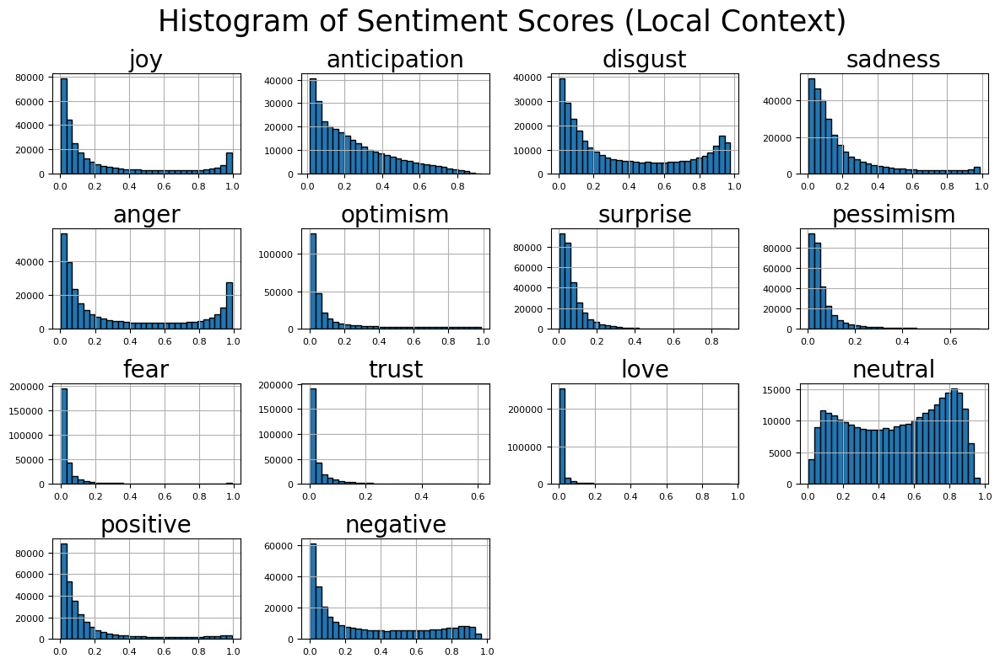

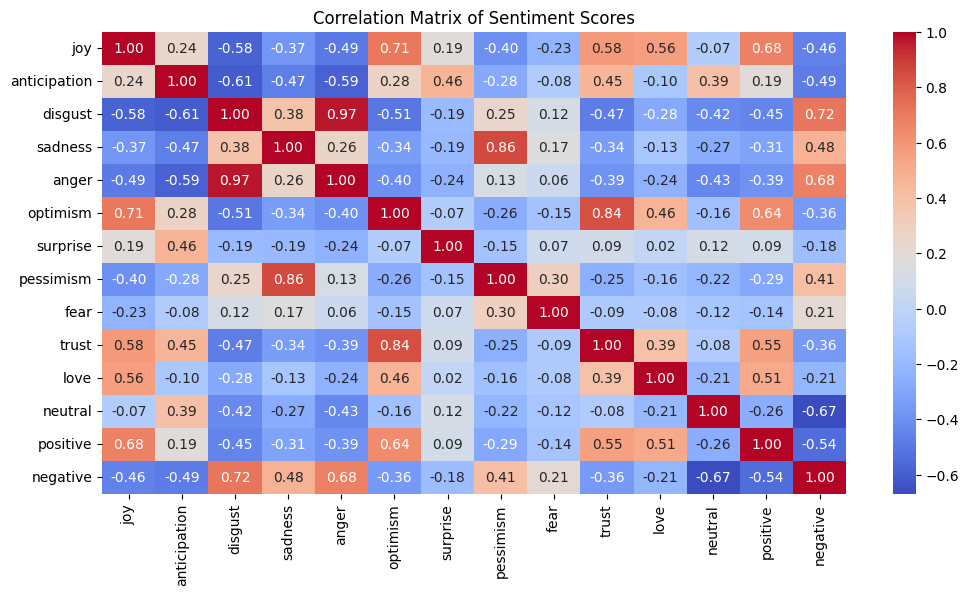

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("Dataset/sentiment_local.csv")

sentiment_cols = df.columns[2:2+14]  

### 1. Summary Statistics ###
# summary_stats = df[sentiment_cols].describe()
# print("Summary Statistics:\n", summary_stats)

### 2. Distribution Plots ###
plt.figure(figsize=(12, 8))
axes = df[sentiment_cols].hist(bins=30, figsize=(12, 8), layout=(4, 4), edgecolor='black')

# Increase each subplot title font size
for ax in axes.ravel():
    ax.set_title(ax.get_title(), fontsize=20)     # subtitles
    ax.tick_params(axis='both', labelsize=8)      # numbers on axes

plt.suptitle("Histogram of Sentiment Scores (Local Context)", fontsize=25)
plt.tight_layout()
plt.show()

### 3. Correlation Matrix ###
plt.figure(figsize=(12, 6))
sns.heatmap(df[sentiment_cols].corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Sentiment Scores")
plt.show()

/tmp/ipykernel_412234/2162680445.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="dominant_emotion", data=df, palette="coolwarm")


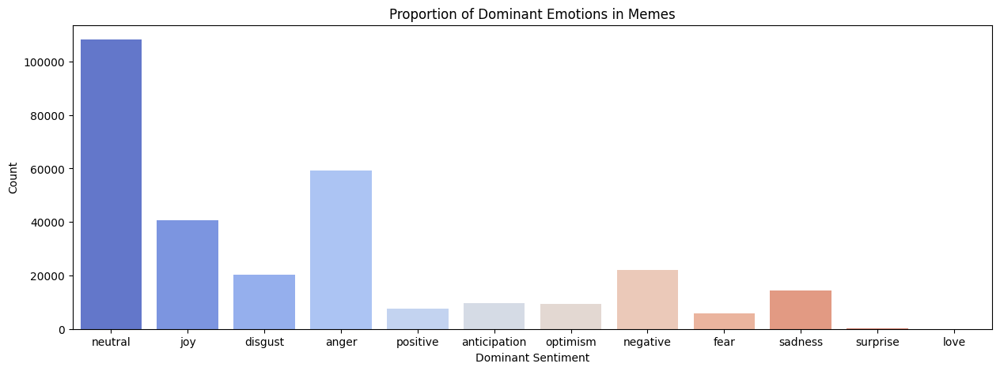

In [2]:
### 4. Sentiment Proportions ###
df["dominant_emotion"] = df[sentiment_cols].idxmax(axis=1)

plt.figure(figsize=(15, 5))
sns.countplot(x="dominant_emotion", data=df, palette="coolwarm")
plt.title("Proportion of Dominant Emotions in Memes")
plt.xlabel("Dominant Sentiment")
plt.ylabel("Count")
plt.show()

/tmp/ipykernel_412234/1436489259.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_proportions.index, y=sentiment_proportions.values, palette="coolwarm")


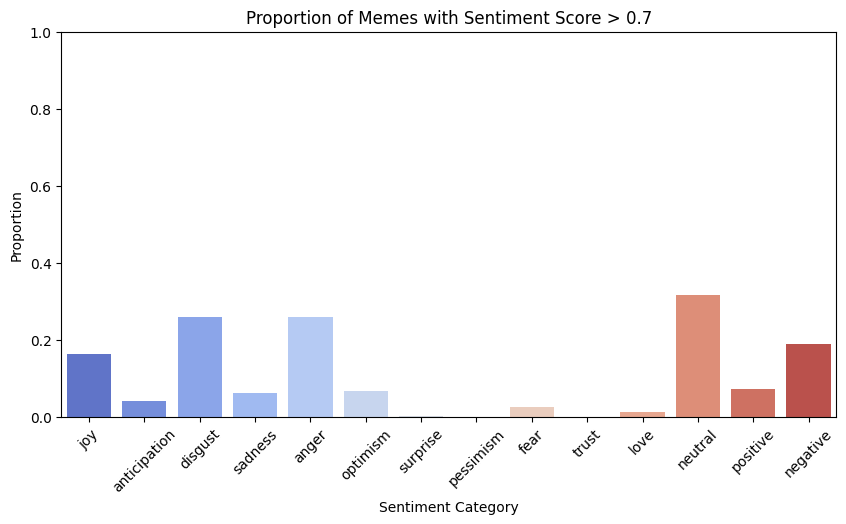

In [4]:
sentiment_proportions = (df[sentiment_cols] > 0.7).mean()

plt.figure(figsize=(10, 5))
sns.barplot(x=sentiment_proportions.index, y=sentiment_proportions.values, palette="coolwarm")

plt.title("Proportion of Memes with Sentiment Score > 0.7")
plt.xlabel("Sentiment Category")
plt.ylabel("Proportion")
plt.xticks(rotation=45)
plt.ylim(0, 1) 
plt.show()

### Sentiment Trends and Patterns

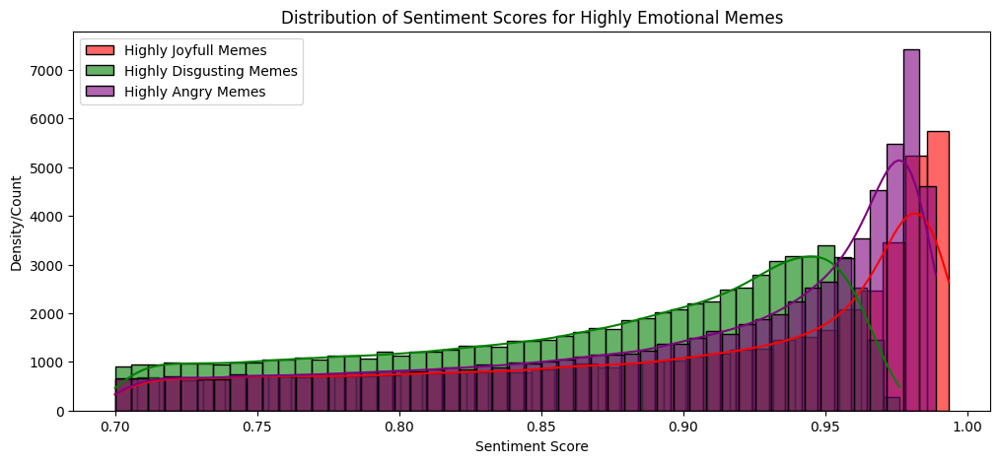

In [5]:
high_joy = df[df["joy"] > 0.7]
# high_neutral = df[df["neutral"] > 0.7]
high_disgust = df[df["disgust"] > 0.7]
high_anger = df[df["anger"] > 0.7]
# high_sadness = df[df["sadness"] > 0.7]
# high_anticipation = df[df["anticipation"] > 0.7]
# high_negative = df[df["negative"] > 0.7]
# high_positive = df[df["positive"] > 0.7]
# high_fear = df[df["fear"] > 0.7]
# high_love = df[df["love"] > 0.7]
# high_optimism = df[df["optimism"] > 0.7]
# high_surprise = df[df["surprise"] > 0.7]
# high_pessimism = df[df["pessimism"] > 0.7]

plt.figure(figsize=(12, 5))

sns.histplot(high_joy['joy'], label="Highly Joyfull Memes", color="red", alpha=0.6, kde=True)
# sns.histplot(high_neutral['neutral'], label="Highly Neutral Memes", color="blue", alpha=0.6, kde=True)
sns.histplot(high_disgust['disgust'], label="Highly Disgusting Memes", color="green", alpha=0.6, kde=True)
sns.histplot(high_anger['anger'], label="Highly Angry Memes", color="purple", alpha=0.6, kde=True)
# sns.histplot(high_sadness['sadness'], label="Highly Sad Memes", color="orange", alpha=0.6, kde=True)
# sns.histplot(high_anticipation['anticipation'], label="Highly Anticipated Memes", color="pink", alpha=0.6, kde=True)
# sns.histplot(high_negative['negative'], label="Highly Negative Memes", color="brown", alpha=0.6, kde=True)
# sns.histplot(high_positive['positive'], label="Highly Positive Memes", color="yellow", alpha=0.6, kde=True)
# sns.histplot(high_fear['fear'], label="Highly Fearful Memes", color="gray", alpha=0.6, kde=True)
# sns.histplot(high_love['love'], label="Highly Loving Memes", color="teal", alpha=0.6, kde=True)
# sns.histplot(high_optimism['optimism'], label="Highly Optimistic Memes", color="magenta", alpha=0.6, kde=True)

# sns.histplot(high_pessimism['pessimism'], label="Highly Pessimistic Memes", color="violet", alpha=0.6, kde=True)
# sns.histplot(high_surprise['surprise'], label="Highly Surprising Memes", color="cyan", alpha=0.6, kde=True)


plt.title("Distribution of Sentiment Scores for Highly Emotional Memes")
plt.xlabel("Sentiment Score")
plt.ylabel("Density/Count")
plt.legend()
plt.show()

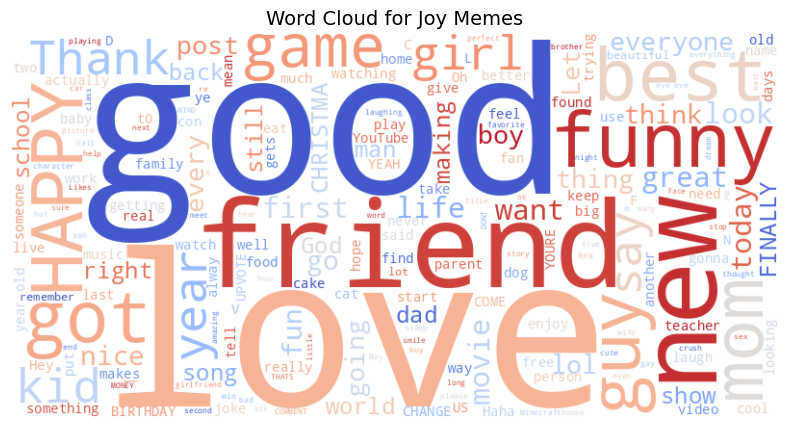

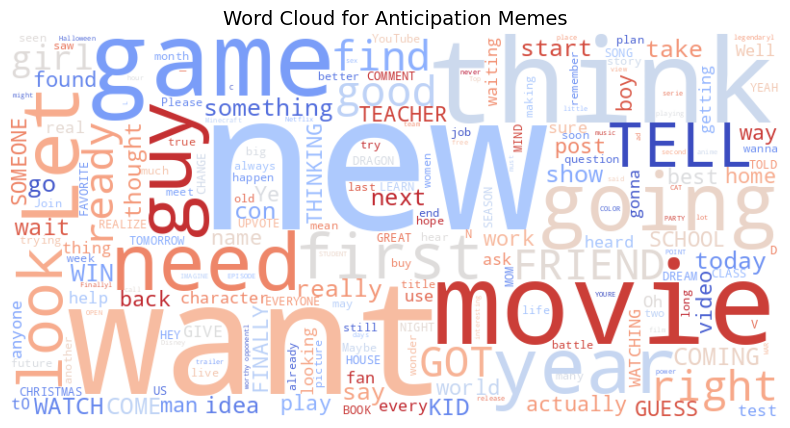

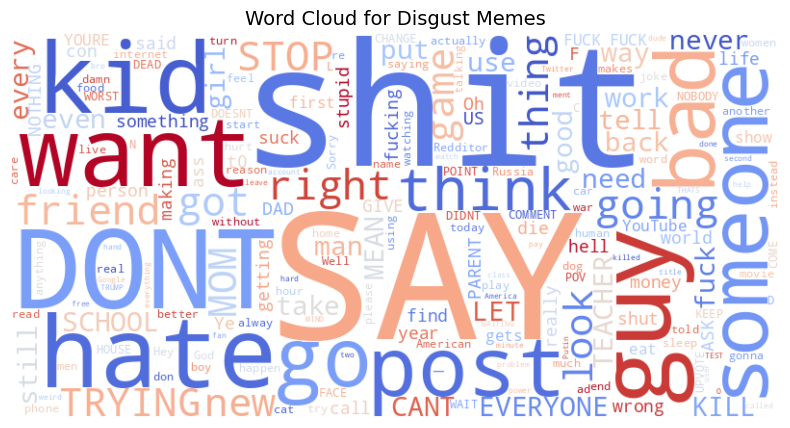

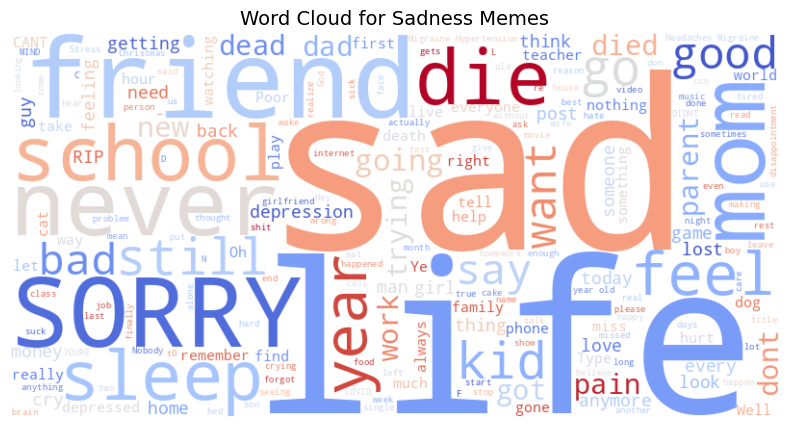

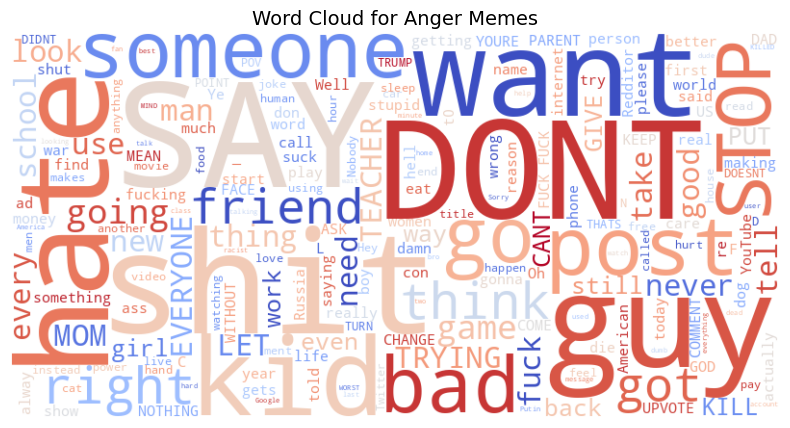

...

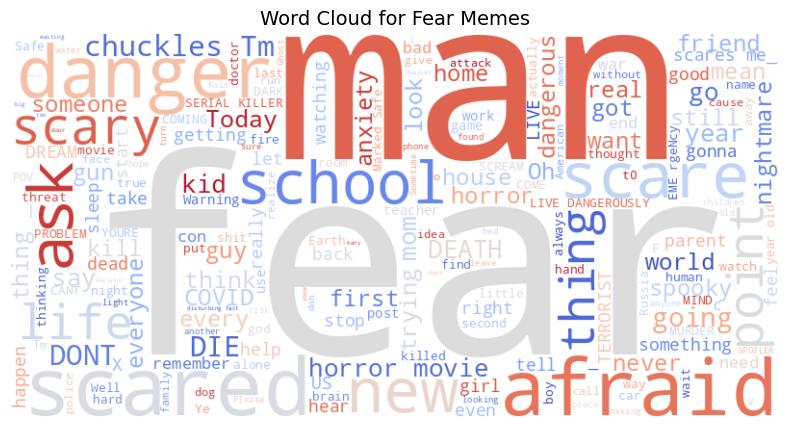

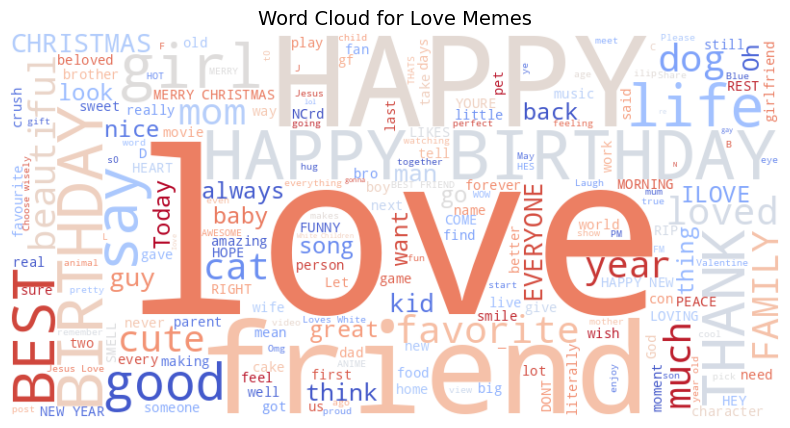

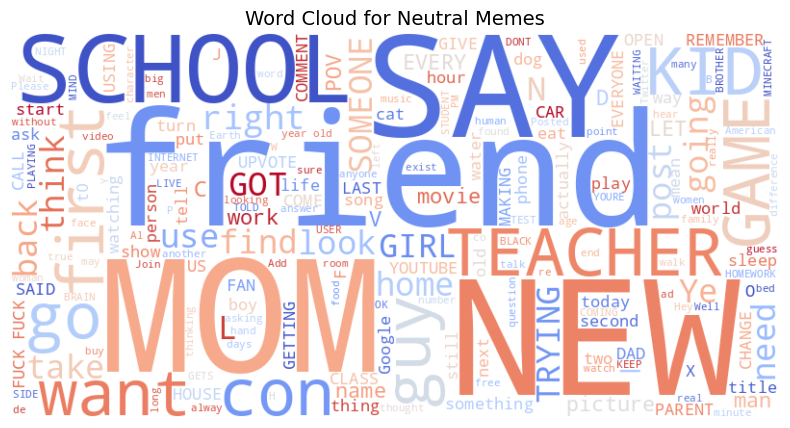

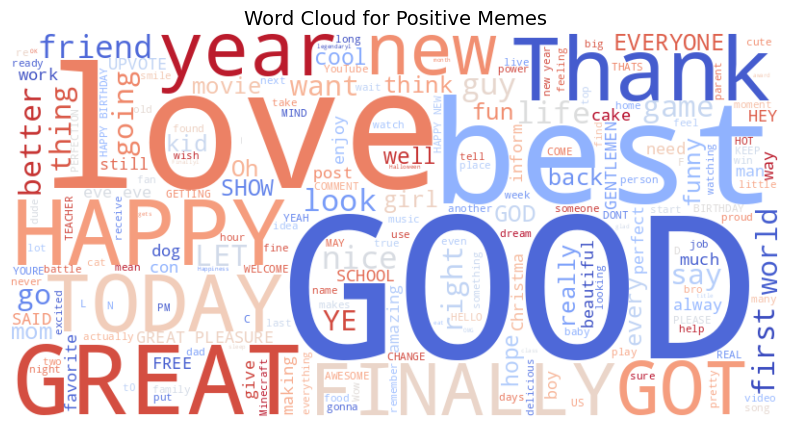

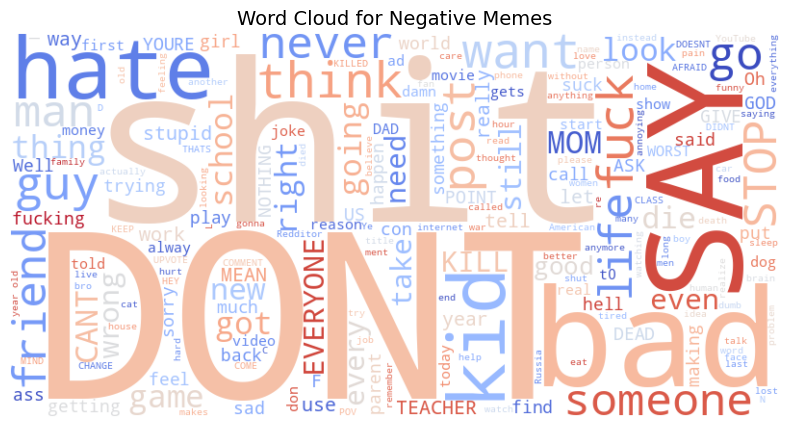

In [6]:
from wordcloud import WordCloud, STOPWORDS

threshold = 0.7  # Threshold for high-scoring memes
custom_stopwords = STOPWORDS.union({"T","meme","memes", "people","Reddit","make","made","S","one","know","day","time","now","u","will","see","Im","m","e"})

def plot_wordcloud(text, title, color="black"):
    wordcloud = WordCloud(stopwords=custom_stopwords,
    width=800, 
    height=400, 
    background_color=color, 
    colormap="coolwarm").generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title, fontsize=14)
    plt.show()

for sentiment in sentiment_cols:
    high_scoring_memes = df[df[sentiment] > threshold]["Extracted Text + Title"]
    if not high_scoring_memes.empty:
        plot_wordcloud(high_scoring_memes, f"Word Cloud for {sentiment.capitalize()} Memes", color="white")

### Sentiments vs Date Created

Joy and Neutral are highly domminant, we will put them in one group.
Anticipation & Disgust is the next group.
All other sentiments.

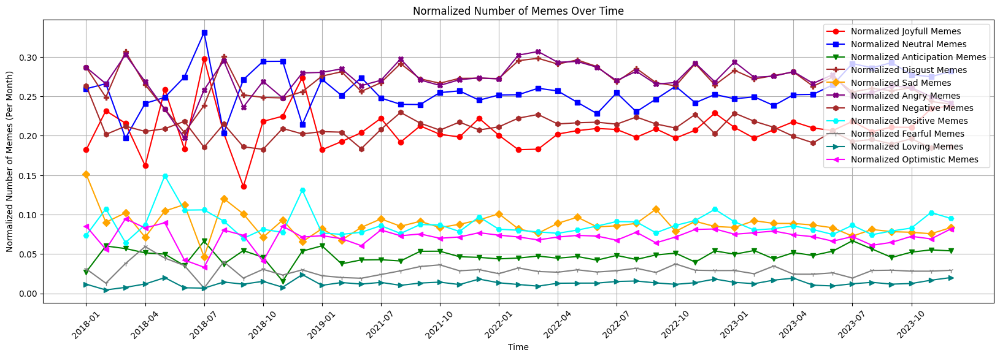

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

df_withDate = pd.read_csv("Reddit_LocalContext.csv")

df_withDate['Date'] = pd.to_datetime(df_withDate['created_utc'])
df_withDate['Month'] = df_withDate['Date'].dt.to_period('M') 


threshold = 0.7

#total memes uploaded per month
meme_counts = df_withDate.groupby('Month').agg(
    total_memes=('Filename', 'size')
)

sentiment_counts = df_withDate.groupby('Month').agg(
    joyfull_memes=('joy_local', lambda x: (x > threshold).sum()),
    neutral_memes=('neutral_local', lambda x: (x > threshold).sum()),
    anticipation_memes=('anticipation_local', lambda x: (x > threshold).sum()),
    disgust_memes=('disgust_local', lambda x: (x > threshold).sum()),
    sad_memes=('sadness_local', lambda x: (x > threshold).sum()),
    anger_memes=('anger_local', lambda x: (x > threshold).sum()),
    # surprise_memes=('surprise', lambda x: (x > threshold).sum()),
    negative_memes=('negative_local', lambda x: (x > threshold).sum()),
    positive_memes=('positive_local', lambda x: (x > threshold).sum()),
    fear_memes=('fear_local', lambda x: (x > threshold).sum()),
    # pessimism_memes=('pessimism', lambda x: (x > threshold).sum()),
    love_memes=('love_local', lambda x: (x > threshold).sum()),
    optimism_memes=('optimism_local', lambda x: (x > threshold).sum()),
)

normalized_sentiment_counts = sentiment_counts.div(meme_counts['total_memes'], axis=0)

plt.figure(figsize=(20, 6))
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["joyfull_memes"], marker='o', label="Normalized Joyfull Memes", color="red")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["neutral_memes"], marker='s', label="Normalized Neutral Memes", color="blue")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["anticipation_memes"], marker='v', label="Normalized Anticipation Memes", color="green")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["disgust_memes"], marker='P', label="Normalized Disgust Memes", color="brown")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["sad_memes"], marker='D', label="Normalized Sad Memes", color="orange")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["anger_memes"], marker='X', label="Normalized Angry Memes", color="purple")
# plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["surprise_memes"], marker='*', label="Normalized Surprising Memes", color="cyan")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["negative_memes"], marker='h', label="Normalized Negative Memes", color="brown")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["positive_memes"], marker='H', label="Normalized Positive Memes", color="cyan")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["fear_memes"], marker='1', label="Normalized Fearful Memes", color="gray")
# plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["pessimism_memes"], marker='|', label="Normalized Pessimistic Memes", color="violet")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["love_memes"], marker='>', label="Normalized Loving Memes", color="teal")
plt.plot(normalized_sentiment_counts.index.astype(str), normalized_sentiment_counts["optimism_memes"], marker='<', label="Normalized Optimistic Memes", color="magenta")

plt.xlabel("Time")
plt.ylabel("Normalized Number of Memes (Per Month)")
plt.title("Normalized Number of Memes Over Time")

tick_positions = range(0, len(normalized_sentiment_counts), 3)
tick_labels = normalized_sentiment_counts.index.astype(str)[tick_positions]
plt.xticks(tick_positions, tick_labels, rotation=45)
plt.legend()
plt.grid(True)
plt.show()

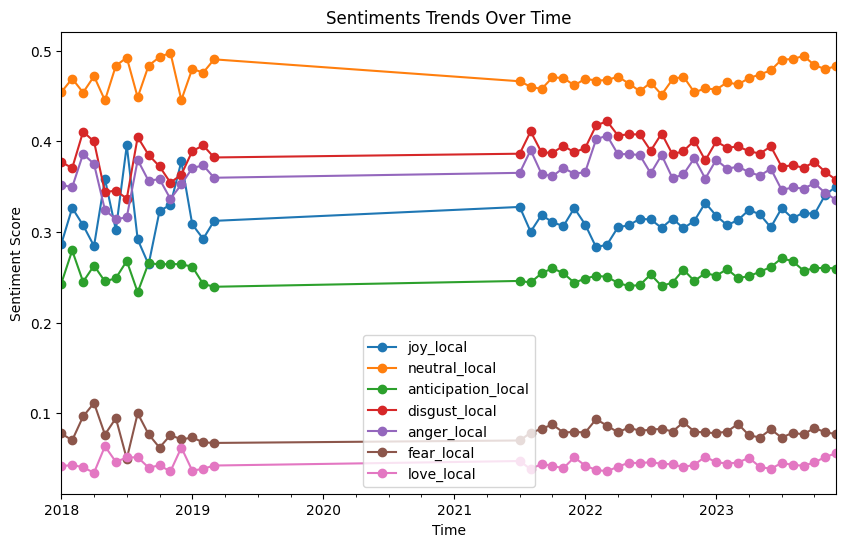

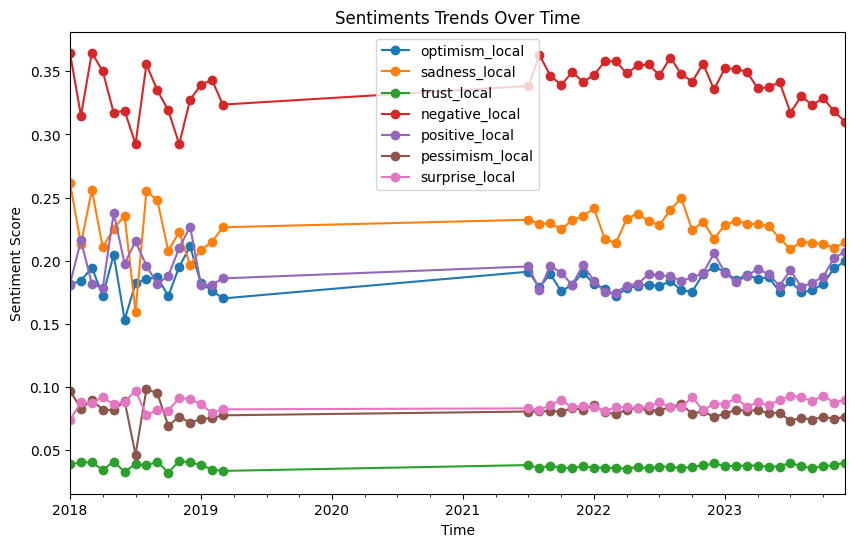

In [10]:
df_withDate = pd.read_csv("Reddit_LocalContext.csv")
df_withDate['Date'] = pd.to_datetime(df_withDate['created_utc'])
df_withDate['Time'] = df_withDate['Date'].dt.to_period('M') 

sentiment_trends1 = df_withDate.groupby('Time')[['joy_local', 'neutral_local','anticipation_local', 'disgust_local','anger_local', "fear_local","love_local"]].mean()
sentiment_trends1.plot(kind='line', figsize=(10, 6), title="Sentiments Trends Over Time",marker='o')
plt.ylabel('Sentiment Score')
# plt.show()

sentiment_trends2 = df_withDate.groupby('Time')[["optimism_local","sadness_local","trust_local","negative_local","positive_local",'pessimism_local','surprise_local']].mean()
sentiment_trends2.plot(kind='line', figsize=(10, 6), title="Sentiments Trends Over Time",marker='o')
plt.ylabel('Sentiment Score')
plt.show()


### Sentiments vs Upvotes

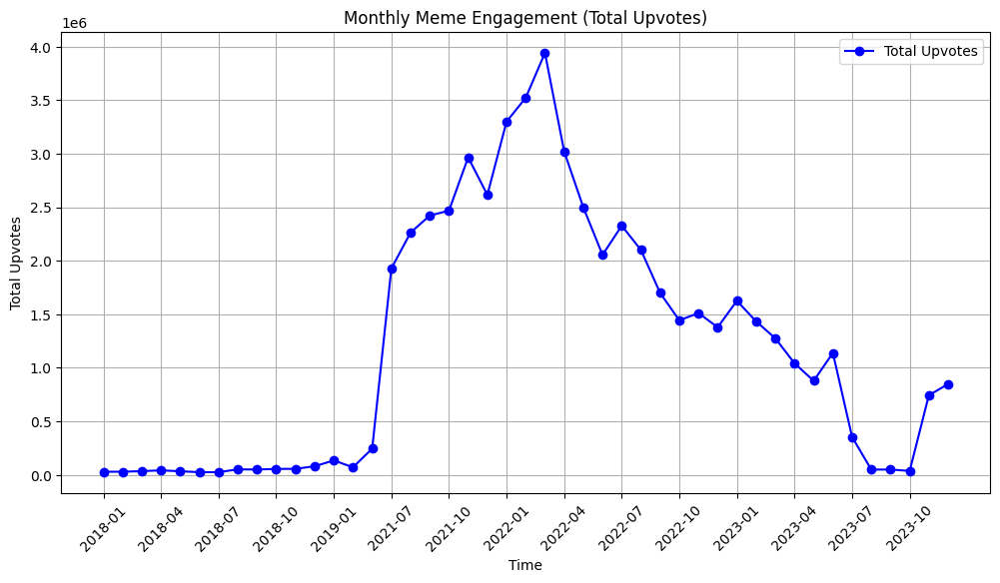

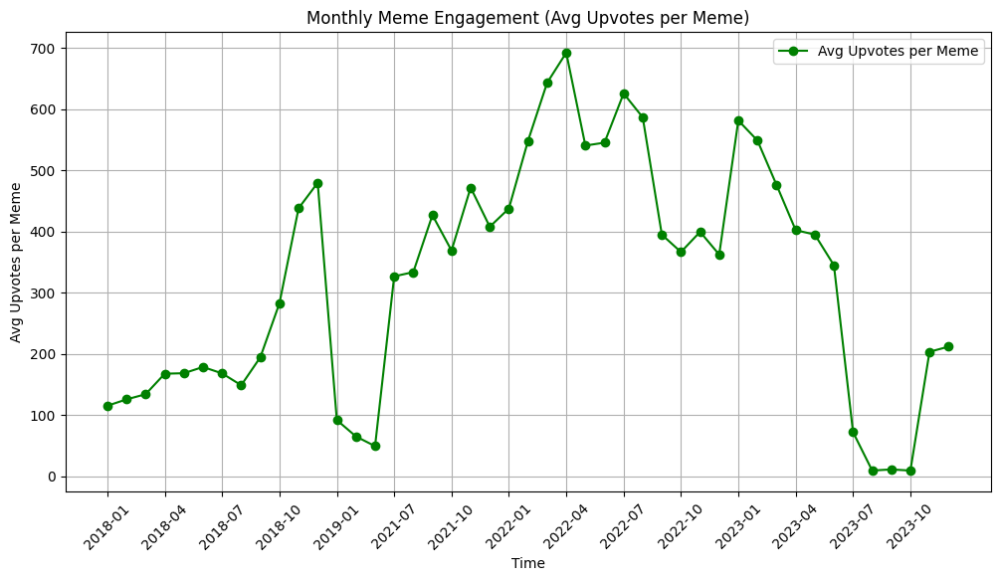

In [11]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("Reddit_LocalContext.csv")
df["Date"] = pd.to_datetime(df["created_utc"])
df["Month"] = df["Date"].dt.to_period("M") 
monthly_engagement = df.groupby('Month').agg(
    total_upvotes=('score', 'sum'),
    total_memes=('score', 'size')
).reset_index()

# Calculate average upvotes per meme (normalize engagement)
monthly_engagement['avg_upvotes_per_meme'] = monthly_engagement['total_upvotes'] / monthly_engagement['total_memes']

# Plot the trend of total upvotes over time
plt.figure(figsize=(12, 6))
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_upvotes'], marker='o', color='blue', label='Total Upvotes')
plt.title("Monthly Meme Engagement (Total Upvotes)")
plt.xlabel("Time")
plt.ylabel("Total Upvotes")
tick_positions = range(0, len(normalized_sentiment_counts), 3)
tick_labels = normalized_sentiment_counts.index.astype(str)[tick_positions]
plt.xticks(tick_positions, tick_labels, rotation=45)
plt.grid(True)
plt.legend()
plt.show()

# Plot the trend of average upvotes per meme over time
plt.figure(figsize=(12, 6))
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['avg_upvotes_per_meme'], marker='o', color='green', label='Avg Upvotes per Meme')
plt.title("Monthly Meme Engagement (Avg Upvotes per Meme)")
plt.xlabel("Time")
plt.ylabel("Avg Upvotes per Meme")
tick_positions = range(0, len(normalized_sentiment_counts), 3)
tick_labels = normalized_sentiment_counts.index.astype(str)[tick_positions]
plt.xticks(tick_positions, tick_labels, rotation=45)
plt.grid(True)
plt.legend()
plt.show()

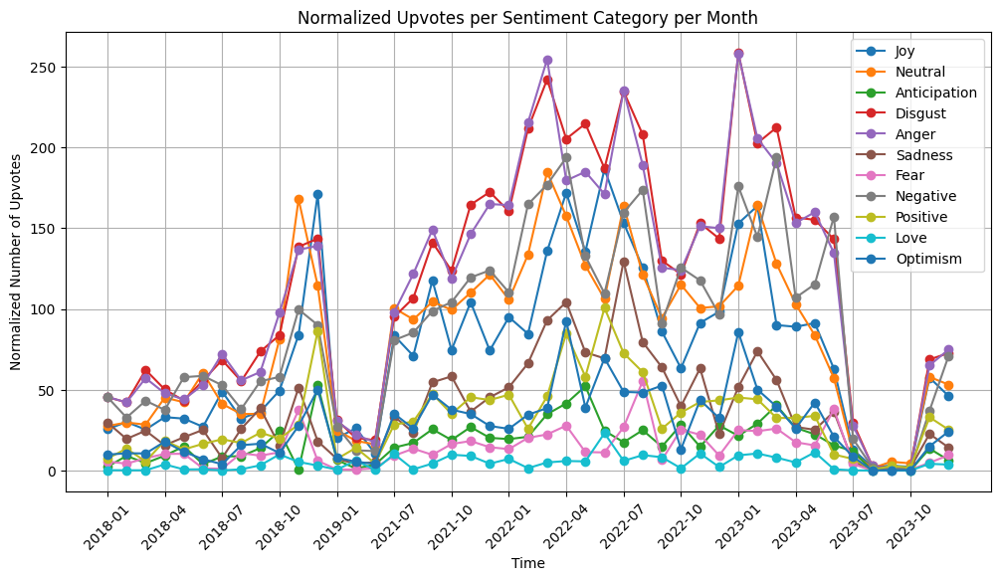

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("Reddit_LocalContext.csv")
threshold = 0.7
df_filtered = df[
    (df["joy_local"] > threshold) |
    (df["neutral_local"] > threshold) |
    (df["anticipation_local"] > threshold) |
    (df["disgust_local"] > threshold) |
    (df["anger_local"] > threshold) |
    (df["sadness_local"] > threshold) |
    # (df["surprise_local"] > threshold) |
    (df["fear_local"] > threshold) |
    (df["negative_local"] > threshold) |
    (df["positive_local"] > threshold) |
    # (df["pessimism_local"] > threshold) |
    (df["love_local"] > threshold) |
    (df["optimism_local"] > threshold)
].copy()

df_filtered["Date"] = pd.to_datetime(df_filtered["created_utc"]) 
df_filtered["Month"] = df_filtered["Date"].dt.to_period("M")

monthly_engagement = df_filtered.groupby('Month').agg(
    joy_upvotes=('score', lambda x: x[df_filtered["joy_local"] > threshold].sum()/len(x)),
    neutral_upvotes=('score', lambda x: x[df_filtered["neutral_local"] > threshold].sum()/len(x)),
    anticipation_upvotes=('score', lambda x: x[df_filtered["anticipation_local"] > threshold].sum()/len(x)),
    disgust_upvotes=('score', lambda x: x[df_filtered["disgust_local"] > threshold].sum()/len(x)),
    anger_upvotes=('score', lambda x: x[df_filtered["anger_local"] > threshold].sum()/len(x)),
    sadness_upvotes=('score', lambda x: x[df_filtered["sadness_local"] > threshold].sum()/len(x)),
    # surprise_upvotes=('score', lambda x: x[df_filtered["surprise_local"] > threshold].sum()/len(x)),
    fear_upvotes=('score', lambda x: x[df_filtered["fear_local"] > threshold].sum()/len(x)),
    negative_upvotes=('score', lambda x: x[df_filtered["negative_local"] > threshold].sum()/len(x)),
    positive_upvotes=('score', lambda x: x[df_filtered["positive_local"] > threshold].sum()/len(x)),
    # pessimism_upvotes=('score', lambda x: x[df_filtered["pessimism_local"] > threshold].sum()/len(x)),
    love_upvotes=('score', lambda x: x[df_filtered["love_local"] > threshold].sum()/len(x)),
    optimism_upvotes=('score', lambda x: x[df_filtered["optimism_local"] > threshold].sum()/len(x)),
).reset_index()

sentiment_categories = ["joy", "neutral", "anticipation", "disgust", "anger", "sadness", "fear", "negative", "positive", "love", "optimism"]

plt.figure(figsize=(12, 6))
for sentiment in sentiment_categories:
    plt.plot(monthly_engagement['Month'].astype(str), 
             monthly_engagement[f'{sentiment}_upvotes'], 
             marker='o', label=sentiment.capitalize())

plt.title("Normalized Upvotes per Sentiment Category per Month")
plt.xlabel("Time")
plt.ylabel("Normalized Number of Upvotes")
tick_positions = range(0, len(monthly_engagement), 3)
tick_labels = monthly_engagement['Month'].astype(str)[tick_positions]
plt.xticks(tick_positions, tick_labels, rotation=45)
plt.grid(True)
plt.legend()
plt.show()

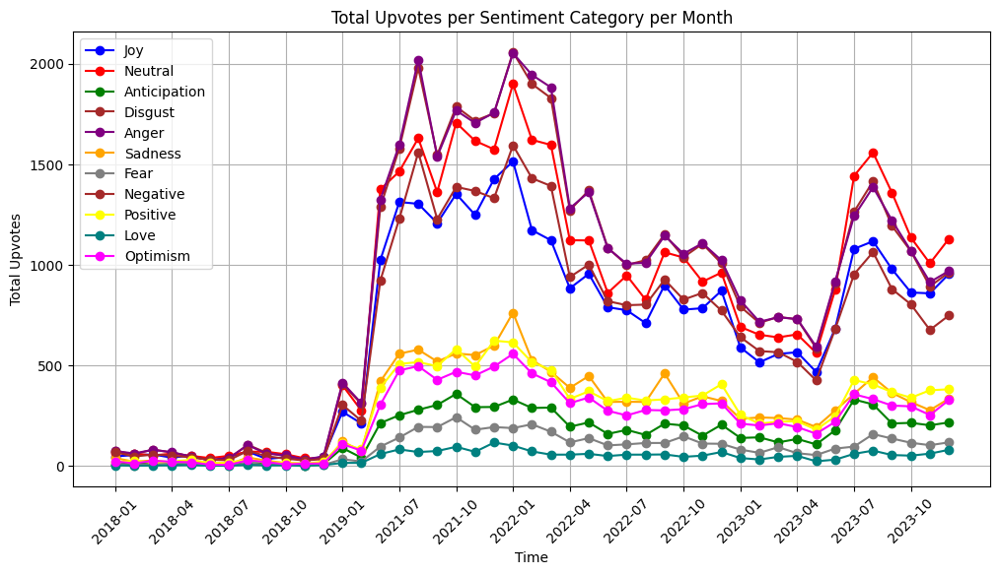

In [31]:
# total upvotes per sentiment category
monthly_engagement = df_filtered.groupby('Month').agg(
    total_joy_upvotes=('joy_local', lambda x: (x > 0.7).sum()),
    total_neutral_upvotes=('neutral_local', lambda x: (x > 0.7).sum()),
    total_anticipation_upvotes=('anticipation_local', lambda x: (x > 0.7).sum()),
    total_disgust_upvotes=('disgust_local', lambda x: (x > 0.7).sum()),
    total_anger_upvotes=('anger_local', lambda x: (x > 0.7).sum()),
    total_sadness_upvotes=('sadness_local', lambda x: (x > 0.7).sum()),
    # total_surprise_upvotes=('surprise_local', lambda x: (x > 0.7).sum()),
    total_fear_upvotes=('fear_local', lambda x: (x > 0.7).sum()),
    total_negative_upvotes=('negative_local', lambda x: (x > 0.7).sum()),
    total_positive_upvotes=('positive_local', lambda x: (x > 0.7).sum()),
    # total_pessimism_upvotes=('pessimism_local', lambda x: (x > 0.7).sum()),
    total_love_upvotes=('love_local', lambda x: (x > 0.7).sum()),
    total_optimism_upvotes=('optimism_local', lambda x: (x > 0.7).sum())
).reset_index()

plt.figure(figsize=(12, 6))
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_joy_upvotes'], marker='o', color='blue', label='Joy')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_neutral_upvotes'], marker='o', color='red', label='Neutral')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_anticipation_upvotes'], marker='o', color='green', label='Anticipation')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_disgust_upvotes'], marker='o', color='brown', label='Disgust')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_anger_upvotes'], marker='o', color='purple', label='Anger')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_sadness_upvotes'], marker='o', color='orange', label='Sadness')
# plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_surprise_upvotes'], marker='o', color='cyan', label='Surprise')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_fear_upvotes'], marker='o', color='gray', label='Fear')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_negative_upvotes'], marker='o', color='brown', label='Negative')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_positive_upvotes'], marker='o', color='yellow', label='Positive')
# plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_pessimism_upvotes'], marker='o', color='violet', label='Pessimism')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_love_upvotes'], marker='o', color='teal', label='Love')
plt.plot(monthly_engagement['Month'].astype(str), monthly_engagement['total_optimism_upvotes'], marker='o', color='magenta', label='Optimism')

plt.title("Total Upvotes per Sentiment Category per Month")
plt.xlabel("Time")
plt.ylabel("Total Upvotes")
tick_positions = range(0, len(monthly_engagement), 3)
tick_labels = monthly_engagement['Month'].astype(str)[tick_positions]
plt.xticks(tick_positions, tick_labels, rotation=45)
plt.grid(True)
plt.legend()
plt.show()

## Auxiliary Feature (text length)

In [ ]:
# import pandas as pd
# import re

# df_text = pd.read_csv(
#     "Dataset/local_text_length.csv.csv",
#     header=None,
#     names=["Filename", "Extracted Text"]
# )

# df_text["text_length"] = df_text["Extracted Text"].astype(str).apply(
#     lambda s: len(re.sub(r"\s+", "", s))
# )

# out = df_text[["Filename", "text_length"]]
# out.to_csv("Dataset/local_text_length.csv", index=False)

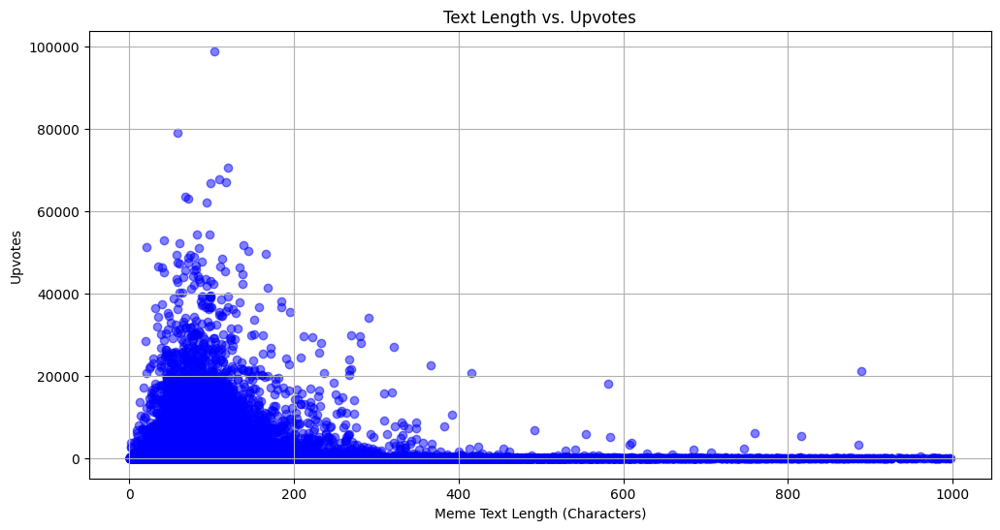

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets
df = pd.read_csv("Dataset/local_text_length.csv")
df_metadata = pd.read_csv("Dataset/metadata_Reddit.csv")

# Merge the dataframes on a common column (e.g., Filename) to ensure alignment
df_merged = df.merge(df_metadata, on='Filename', how='inner')

# Remove outliers
df_merged = df_merged[df_merged['text_length'] < 1000]

# Plot text length vs. upvotes
plt.figure(figsize=(12, 6))
plt.scatter(df_merged["text_length"], df_merged["score"], alpha=0.5, color='blue')
plt.title("Text Length vs. Upvotes")
plt.xlabel("Meme Text Length (Characters)")
plt.ylabel("Upvotes")
plt.grid(True)
plt.show()

In [ ]:
# import pandas as pd

# df = pd.read_csv("Dataset/metadata+Reddit_global.csv")

# cols_to_drop = [
#     "joy_global","anticipation_global","disgust_global","sadness_global","anger_global",
#     "optimism_global","surprise_global","pessimism_global","fear_global","trust_global",
#     "love_global","neutral_global","positive_global","negative_global",
#     "Topic","Probability"
# ]

# df = df.drop(columns=cols_to_drop, errors="ignore")  # errors="ignore" avoids crashing if a column is missing
# df.to_csv("metadata_reddit.csv", index=False)

## Topic Modeling

In [17]:
from bertopic import BERTopic
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import TfidfVectorizer
from sentence_transformers import SentenceTransformer
import pandas as pd
from bertopic.representation import KeyBERTInspired
from bertopic.representation import MaximalMarginalRelevance
import openai
from bertopic.representation import OpenAI
import csv
import os
import torch
import numpy as np

os.environ["TOKENIZERS_PARALLELISM"] = "false"

# Load dataset
df = pd.read_csv("Dataset/local_context.csv", header=None, names=["Filename", "Extracted Text"])
print(df.shape)
# get the first and second columns
# docs = df.iloc[:, 1].values
docs = df["Extracted Text"].astype(str).values
print(docs.shape)

# Define models
embedding_model = SentenceTransformer("all-mpnet-base-v2")
# embeddings = np.load("embeddings_mpnet_local.npy")
umap_model = UMAP(n_neighbors=20, n_components=5, min_dist=0.0, metric='cosine', random_state=42) #20,5,0.0
hdbscan_model = HDBSCAN(min_cluster_size=30, min_samples=10, metric='euclidean', cluster_selection_method='eom') #30
vectorizer_model = TfidfVectorizer(stop_words="english", max_features=10000)

# Generate embeddings
embeddings = embedding_model.encode(docs, show_progress_bar=True)  # returns np.ndarray
# np.save("embeddings_mpnet_global.npy", embeddings)
# print(embeddings.shape)

representation_model = [KeyBERTInspired(),MaximalMarginalRelevance(diversity=0.5)]
# Initialize BERTopic with custom components
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    nr_topics=300,
    representation_model=representation_model,
    # seed_topic_list=topics,
    verbose=True
)

# Fit the model
embeddings_mpnet_local = np.load("embeddings_mpnet_local.npy")
topics, probs = topic_model.fit_transform(docs, embeddings_mpnet_local)
doc_info = topic_model.get_document_info(docs)
doc_info = doc_info[['Document','Name', 'Probability']]

# Save the topics and probabilities as csv
# doc_info.to_csv("topic_global_context.csv", index=False)

(297671, 2)
(297671,)


Batches:   0%|          | 0/9303 [00:00<?, ?it/s]

2026-01-17 00:26:27,914 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-01-17 00:31:01,301 - BERTopic - Dimensionality - Completed ✓
2026-01-17 00:31:01,303 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-01-17 00:31:10,918 - BERTopic - Cluster - Completed ✓
2026-01-17 00:31:10,919 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-01-17 00:31:14,091 - BERTopic - Representation - Completed ✓
2026-01-17 00:31:14,092 - BERTopic - Topic reduction - Reducing number of topics
2026-01-17 00:31:14,243 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-01-17 00:31:25,593 - BERTopic - Representation - Completed ✓
2026-01-17 00:31:25,608 - BERTopic - Topic reduction - Reduced number of topics from 1138 to 300


In [18]:
doc_info = topic_model.get_document_info(docs)
filtered_doc_info = doc_info[doc_info['Topic'] != -1]
filtered_doc_info
# doc_info 77k

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
1,STARSHIP TROOPERS STAR TREK STAR WARS ngfip_ C...,146,146_shrek_donkey_trek_animated,"[shrek, donkey, trek, animated, star, jean, dr...","[ Fiallly Shrek Dlood , A J | SHReK F GIGASHRE...",shrek - donkey - trek - animated - star - jean...,0.707283,False
2,What that one guy with a peanut allergy says ...,45,45_candy_candies_sugar_chocolates,"[candy, candies, sugar, chocolates, chocolate,...",[ WHEN KIDS SAY THEY HAVE CANDY DID YOU MEAN O...,candy - candies - sugar - chocolates - chocola...,1.000000,False
3,When men find out that they are now the world...,26,26_gay_homosexual_lgbt_homophobic,"[gay, homosexual, lgbt, homophobic, bisexual, ...","[ GAY , you are gay am gay , your gay because...",gay - homosexual - lgbt - homophobic - bisexua...,0.170177,False
6,REST HERE SOLDIER YOU HAVE SEEN TOO MANY NNN M...,4,4_license_stealing_stole_steal,"[license, stealing, stole, steal, meme, memes,...",[ Official Meme Stealing License Name: HOBO lh...,license - stealing - stole - steal - meme - me...,1.000000,False
12,ME WHEN IFIND OUT THAT THEREIS MORE THANZ GEND...,26,26_gay_homosexual_lgbt_homophobic,"[gay, homosexual, lgbt, homophobic, bisexual, ...","[ GAY , you are gay am gay , your gay because...",gay - homosexual - lgbt - homophobic - bisexua...,1.000000,False
...,...,...,...,...,...,...,...,...
297662,MY TEACHER WHEN [ GET 10O% ON A TEST YOU SHA...,1,1_teachers_teacher_classroom_teaching,"[teachers, teacher, classroom, teaching, class...",[TEACHER: THE TEST WONT BE THAT HARD THE TEST:...,teachers - teacher - classroom - teaching - cl...,0.899998,False
297663,TANPA BAY LIGHTING [AN AFTEx HAMEU .,138,138_mode_dark_light_brightness,"[mode, dark, light, brightness, bright, lights...",[ HOW DARK MODE USERS DESCRIBE LIGHT MODE mci...,mode - dark - light - brightness - bright - li...,0.702911,False
297665,Your work Assigned useless jpg Image useless ...,158,158_watermark_jpg_png_image,"[watermark, jpg, png, image, images, cropping,...",[Paying money to remove the watermark cropping...,watermark - jpg - png - image - images - cropp...,0.832516,False
297667,SMOKING KILLS4 TIMES AS MANY AS COVIDL BUT TH...,16,16_pepsi_coke_cola_soda,"[pepsi, coke, cola, soda, coca, cigarette, coc...",[ Foieret PEPSI IS BETTER THAN COKE CHANGE MY ...,pepsi - coke - cola - soda - coca - cigarette ...,1.000000,False


In [19]:
#Probability > 0.7
filtered_doc_info = doc_info[doc_info['Probability'] > 0.7]
print(len(filtered_doc_info))

97641


In [20]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,142067,-1_life_complaint_mom_don,"[life, complaint, mom, don, parents, dad, kid,...",[When you still got time left of the day but y...
1,0,4481,0_cat_kitty_kitten_cats,"[cat, kitty, kitten, cats, pet, catnip, meow, ...","[ RKELLYS CAT (, This is a cat, imgtlipucom ..."
2,1,4102,1_teachers_teacher_classroom_teaching,"[teachers, teacher, classroom, teaching, class...",[TEACHER: THE TEST WONT BE THAT HARD THE TEST:...
3,2,4064,2_fffffff_fffuu_ffffff_warning,"[fffffff, fffuu, ffffff, warning, danger, uuuu...",[ WVHENSTEVEISNT INSMASH FFFFFFF FFFFFF FFFUU ...
4,3,3933,3_cake_cakeday_cakes_birthdayl,"[cake, cakeday, cakes, birthdayl, celebrating,...","[They don't know it's my cake day today :) :),..."
...,...,...,...,...,...
295,294,32,294_cameras_camera_security_cam,"[cameras, camera, security, cam, spying, video...",[ WHENYOUHIREABABYSITTTER ANDVOUHAVE CAMERAS A...
296,295,31,295_cancel_canceled_cancelled_culture,"[cancel, canceled, cancelled, culture, resist,...","[ This is way better to cancel than 👍, The per..."
297,296,31,296_piece_needs_need_love,"[piece, needs, need, love, happiness, thing, g...",[Sometimes what a person needs is just one pie...
298,297,30,297_jewish_skin_muslim_cut,"[jewish, skin, muslim, cut, scar, doctors, new...",[Jewish/Muslim doctors when see an infant with...


In [21]:
topic_model.visualize_topics()

Name
1_teachers_teacher_classroom_teaching    3497
0_cat_kitty_kitten_cats                  3433
4_license_stealing_stole_steal           2338
5_sleep_slept_nap_asleep                 2169
9_toilet_toilets_restroom_bathroom       2126
10_disney_netflix_nickelodeon_cartoon    2029
6_pineapple_pizza_taco_tacos             1968
3_cake_cakeday_cakes_birthdayl           1895
8_minecraft_mojang_blizzard_mobs         1813
12_nickels_coin_nickel_coins             1688
13_dad_father_rose_mother                1660
16_pepsi_coke_cola_soda                  1404
29_car_vehicle_cars_vehicles             1388
15_adblock_adblockers_adblocker_ads      1279
25_atheist_atheists_hell_heaven          1255
7_covid19_covid_coronavirus_pandemic     1247
11_karma_memes_points_meme               1231
20_mario_luigi_nintendo_smash            1170
38_job_jobs_employer_workplace           1108
35_starwars_prequels_skywalker_jedi      1024
Name: count, dtype: int64


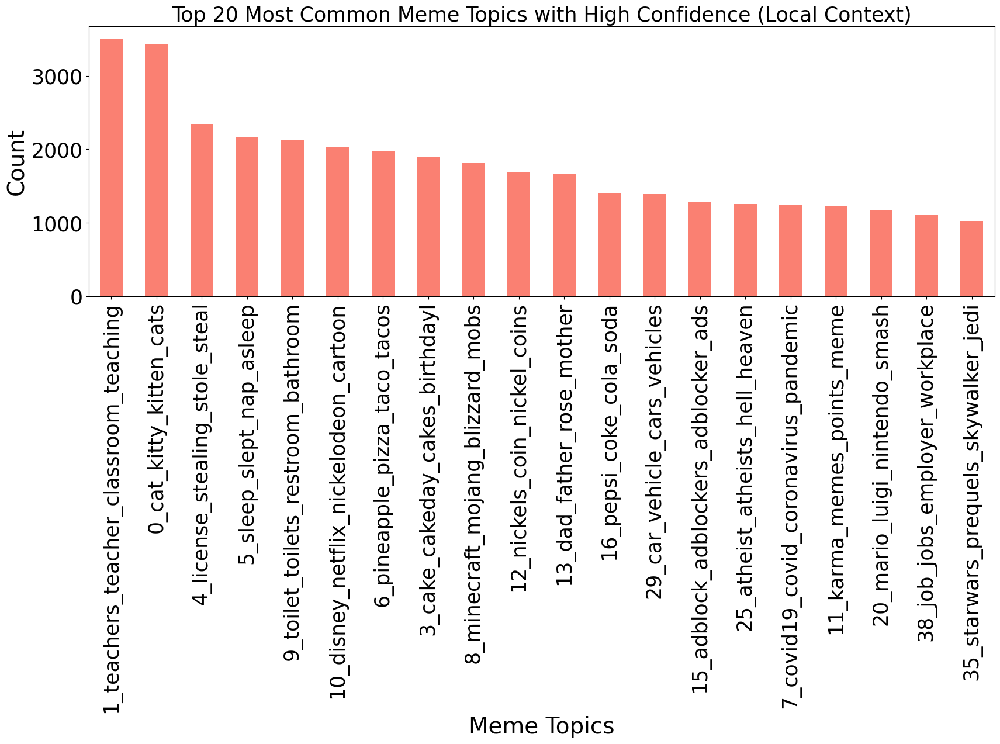

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("Dataset/topic_local_context.csv")

high_confidence_memes = df[df["Probability"] > 0.7]

exclude_topics = [
    "2_fffffff_fffuu_ffffff_warning",
    "18_facetime_imgfip_imgfipcom_alert"
]

high_confidence_memes = high_confidence_memes[~high_confidence_memes["Name"].isin(exclude_topics)]

high_confidence_counts = high_confidence_memes["Name"].value_counts()

print(high_confidence_counts.head(20))

# Plot a bar chart
plt.figure(figsize=(20, 6))
ax = high_confidence_counts[:20].plot(kind='bar', color='salmon')  # Show top 20 topics
ax.tick_params(axis='both', labelsize=25)  # numbers on axes
plt.xlabel("Meme Topics", fontsize = 28)
plt.ylabel("Count", fontsize = 28)
plt.title("Top 20 Most Common Meme Topics with High Confidence (Local Context)", fontsize = 25)
plt.xticks(rotation=90)
plt.show()